# <font color='blue'>Telecom Churn Case Study</font>
* Submitted by:
    1. Rajasekar Shanmugam (rajas@vmware.com)
    2. Shijo Jacob Joshua (Joshua.shijo@gmail.com)
    


In [1]:
# Ignoring warning messages
import warnings
warnings.filterwarnings('ignore')

# Import the required library
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import RFE

pd.set_option('display.max_columns',230)

### Stage 1 : Data understanding, preparation, feature engineering

# Data understanding
All important data quality checks are performed and inconsistent/missing data is handled appropriately.

In [2]:
# reading the input data and preview
# gpath = 'E:/01 PGD-DS/Cource-3/Module-8 - CaseStudy/'
gpath = ''
churn_original = pd.read_csv(gpath+'telecom_churn_data.csv')

#churn_original= pd.read_csv('telecom_churn_data.csv')
churn= churn_original.copy()
churn.head()

# Understand number of rows and columns and sneak of first 5 row
print (churn.shape); 
churn.info()
churn.head(5)

(99999, 226)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Columns: 226 entries, mobile_number to sep_vbc_3g
dtypes: float64(179), int64(35), object(12)
memory usage: 172.4+ MB


,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,

In [3]:
# check the % count of null so that we can impute value appropriately
round(100*(churn.isnull().sum()/len(churn.index)), 2).sort_values(ascending=False).head(50)

count_rech_2g_6             74.85
date_of_last_rech_data_6    74.85
count_rech_3g_6             74.85
av_rech_amt_data_6          74.85
max_rech_data_6             74.85
total_rech_data_6           74.85
arpu_3g_6                   74.85
arpu_2g_6                   74.85
night_pck_user_6            74.85
fb_user_6                   74.85
arpu_3g_7                   74.43
count_rech_2g_7             74.43
fb_user_7                   74.43
count_rech_3g_7             74.43
arpu_2g_7                   74.43
av_rech_amt_data_7          74.43
max_rech_data_7             74.43
night_pck_user_7            74.43
total_rech_data_7           74.43
date_of_last_rech_data_7    74.43
night_pck_user_9            74.08
date_of_last_rech_data_9    74.08
fb_user_9                   74.08
arpu_2g_9                   74.08
max_rech_data_9             74.08
arpu_3g_9                   74.08
total_rech_data_9           74.08
av_rech_amt_data_9          74.08
count_rech_3g_9             74.08
count_rech_2g_

### Drop columns which are not relevant

In [4]:
# Dropping columns mobile and circle as they do not contribue to model building
id_cols = ['mobile_number', 'circle_id']
churn.drop(id_cols, axis=1, inplace=True)

# Understand number of rows and columns and sneak of first 5 row
print (churn.shape); 

(99999, 224)


### Impute missing values with zero

In [5]:
# list of columns to impute missing values with zeroes
recharge_col = ['total_rech_num_6','total_rech_num_7','total_rech_num_8','total_rech_num_9',
                'total_rech_amt_6','total_rech_amt_7','total_rech_amt_8','total_rech_amt_9',
                'total_rech_data_6', 'total_rech_data_7', 'total_rech_data_8','total_rech_data_9', 
                'date_of_last_rech_data_6','date_of_last_rech_data_7','date_of_last_rech_data_8','date_of_last_rech_data_9',
                'av_rech_amt_data_6', 'av_rech_amt_data_7', 'av_rech_amt_data_8','av_rech_amt_data_9',
                'arpu_2g_6', 'arpu_2g_7', 'arpu_2g_8','arpu_2g_9',
                'arpu_3g_6', 'arpu_3g_7', 'arpu_3g_8','arpu_3g_9',
                'count_rech_2g_6', 'count_rech_2g_7', 'count_rech_2g_8', 'count_rech_2g_9',
                'count_rech_3g_6', 'count_rech_3g_7', 'count_rech_3g_8', 'count_rech_3g_9',
                'max_rech_data_6', 'max_rech_data_7', 'max_rech_data_8', 'max_rech_data_9',
                'fb_user_6', 'fb_user_7', 'fb_user_8',  'fb_user_9',
                'night_pck_user_6', 'night_pck_user_7', 'night_pck_user_8','night_pck_user_9']
# impute missing values with 0
churn[recharge_col] = churn[recharge_col].apply(lambda x: x.fillna(0))

In [6]:
# Below method imputes all NaN with 0.
churn.fillna(0,inplace=True)

In [7]:
# check the % count of null again
round(100*(churn.isnull().sum()/len(churn.index)), 2).sort_values(ascending=False).head(10)

sep_vbc_3g        0.0
jun_vbc_3g        0.0
total_og_mou_8    0.0
total_og_mou_7    0.0
total_og_mou_6    0.0
og_others_9       0.0
og_others_8       0.0
og_others_7       0.0
og_others_6       0.0
spl_og_mou_9      0.0
dtype: float64

In above result there are no null values in any columns.
we had successfully handled missing value.

# Handle Categorical Variables by Create Dummy variables

In [8]:
# general method for creating dummy 
def createdummy(col, df):
    temp = pd.get_dummies(df[col], prefix=col, drop_first = True)
    temp_df = pd.concat([df, temp], axis = 1)
    temp_df.drop([col], axis = 1, inplace = True)
    return temp_df

# Let’s impute missing value with  '-1' 
catg_vars = ["night_pck_user_6", "night_pck_user_7", "night_pck_user_8",  "night_pck_user_9", 
             "fb_user_6", "fb_user_7", "fb_user_8", "fb_user_9"]

for var in catg_vars:
    churn[var].fillna(value=-1, inplace=True)

# Create dummy variables for all the categorial variables
churn = createdummy('night_pck_user_6', churn)
churn = createdummy('night_pck_user_7', churn)
churn = createdummy('night_pck_user_8', churn)
churn = createdummy('night_pck_user_9', churn)

churn = createdummy('fb_user_6', churn)
churn = createdummy('fb_user_7', churn)
churn = createdummy('fb_user_8', churn)
churn = createdummy('fb_user_9', churn)


In [9]:
# convert date of last call_recharge columns to datetime format
date_last_rech_vars = ["date_of_last_rech_6",  "date_of_last_rech_7", "date_of_last_rech_8","date_of_last_rech_9"]
churn[date_last_rech_vars].head()

# convert to datetime
for col in date_last_rech_vars:
    churn[col] = pd.to_datetime(churn[col])

print(churn[date_last_rech_vars].info())
churn[date_last_rech_vars].head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Data columns (total 4 columns):
date_of_last_rech_6    99999 non-null datetime64[ns]
date_of_last_rech_7    99999 non-null datetime64[ns]
date_of_last_rech_8    99999 non-null datetime64[ns]
date_of_last_rech_9    99999 non-null datetime64[ns]
dtypes: datetime64[ns](4)
memory usage: 3.1 MB
None


,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9
0,2014-06-21,2014-07-16,2014-08-08,2014-09-28
1,2014-06-29,2014-07-31,2014-08-28,2014-09-30
2,2014-06-17,2014-07-24,2014-08-14,2014-09-29
3,2014-06-28,2014-07-31,2014-08-31,2014-09-30
4,2014-06-26,2014-07-28,2014-08-09,2014-09-28


In [10]:
# convert date of last data_recharge columns to datetime format
date_last_rech_data_vars = ["date_of_last_rech_data_6",  "date_of_last_rech_data_7", "date_of_last_rech_data_8","date_of_last_rech_data_9"]
churn[date_last_rech_data_vars].head()

# convert to datetime
for col in date_last_rech_data_vars:
    churn[col] = pd.to_datetime(churn[col])

print(churn[date_last_rech_data_vars].info())
churn[date_last_rech_data_vars].head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Data columns (total 4 columns):
date_of_last_rech_data_6    99999 non-null datetime64[ns]
date_of_last_rech_data_7    99999 non-null datetime64[ns]
date_of_last_rech_data_8    99999 non-null datetime64[ns]
date_of_last_rech_data_9    99999 non-null datetime64[ns]
dtypes: datetime64[ns](4)
memory usage: 3.1 MB
None


,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9
0,2014-06-21,2014-07-16,2014-08-08,1970-01-01
1,1970-01-01,2014-07-25,2014-08-10,1970-01-01
2,1970-01-01,1970-01-01,1970-01-01,2014-09-17
3,1970-01-01,1970-01-01,1970-01-01,1970-01-01
4,2014-06-04,1970-01-01,1970-01-01,1970-01-01


In [11]:
# Derive new feature
# Create new days columns, instead of date
import datetime
last_date_of_month_6 = datetime.datetime.strptime("30-06-2014", "%d-%m-%Y")
last_date_of_month_7 = datetime.datetime.strptime("31-07-2014", "%d-%m-%Y")
last_date_of_month_8 = datetime.datetime.strptime("31-08-2014", "%d-%m-%Y")
last_date_of_month_9 = datetime.datetime.strptime("31-08-2014", "%d-%m-%Y")

churn["rech_days_left_6"]      = (last_date_of_month_6 - churn.date_of_last_rech_6).astype('timedelta64[D]')
churn["rech_days_left_7"]      = (last_date_of_month_7 - churn.date_of_last_rech_7).astype('timedelta64[D]')
churn["rech_days_left_8"]      = (last_date_of_month_8 - churn.date_of_last_rech_8).astype('timedelta64[D]')
churn["rech_days_left_9"]      = (last_date_of_month_9 - churn.date_of_last_rech_9).astype('timedelta64[D]')

churn["rech_data_days_left_6"]      = (last_date_of_month_6 - churn.date_of_last_rech_data_6).astype('timedelta64[D]')
churn["rech_data_days_left_7"]      = (last_date_of_month_7 - churn.date_of_last_rech_data_7).astype('timedelta64[D]')
churn["rech_data_days_left_8"]      = (last_date_of_month_8 - churn.date_of_last_rech_data_8).astype('timedelta64[D]')
churn["rech_data_days_left_9"]      = (last_date_of_month_9 - churn.date_of_last_rech_data_9).astype('timedelta64[D]')

day_columns = ["rech_days_left_6", "rech_days_left_7", "rech_days_left_8","rech_days_left_9" ,
               "rech_data_days_left_6", "rech_data_days_left_7", "rech_data_days_left_8","rech_data_days_left_9" ]


In [12]:
# Drop all old date columns: add dates columns to drop_column list
churn.drop(date_last_rech_vars, axis=1, inplace=True)
churn.drop(date_last_rech_data_vars, axis=1, inplace=True)

print(churn.shape);



(99999, 224)


In [13]:
# Drop the date columns which would not help to make any business recommendation.
date_id_cols = ['last_date_of_month_6', 'last_date_of_month_7','last_date_of_month_8','last_date_of_month_9']
churn.drop(date_id_cols, axis=1, inplace=True)
print(churn.shape);

(99999, 220)


In [14]:
# Drop columns which has same value in all rows. 
# There is no variance in the values for these column.
nunique = churn.apply(pd.Series.nunique)
cols_to_drop = nunique[nunique == 1].index
print(cols_to_drop)
churn.drop(cols_to_drop, axis=1,inplace=True)
print(churn.shape);


Index(['loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou',
       'std_og_t2c_mou_6', 'std_og_t2c_mou_7', 'std_og_t2c_mou_8',
       'std_og_t2c_mou_9', 'std_ic_t2o_mou_6', 'std_ic_t2o_mou_7',
       'std_ic_t2o_mou_8', 'std_ic_t2o_mou_9'],
      dtype='object')
(99999, 209)


In [15]:
# Now all the data type is either float64 or int64 or  uint8(8).
# We are ready for the model.
churn.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Columns: 209 entries, arpu_6 to rech_data_days_left_9
dtypes: float64(168), int64(33), uint8(8)
memory usage: 154.1 MB


### Oulier Assesment and Treatment.
Use data distribution to find outliers

In [16]:
churn.describe(percentiles=[.01,.25,.5,.75,.90,.95,.99])

,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,night_pck_user_6_1.0,night_pck_user_7_1.0,night_pck_user_8_1.0,night_pck_user_9_1.0,fb_user_6_1.0,fb_user_7_1.0,fb_user_8_1.0,fb_user_9_1.0,rech_days_left_6,rech_days_left_7,rech_days_left_8,rech_days_left_9,rech_data_days_left_6,rech_data_days_left_7,rech_data_days_left_8,rech_data_days_left_9
count,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.00000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000

In [17]:
# Determine the outlier 
# If outlier is lesser than the 1% percentile, then reset it  to 1% percentile
# If outlier is greater than the 99% percentile, then reset it  to 99% percentile
cont_cols = [col for col in churn.columns]

for col in cont_cols:
    percentiles = churn[col].quantile([0.01,0.99]).values
    churn[col][churn[col] <= percentiles[0]] = percentiles[0]
    churn[col][churn[col] >= percentiles[1]] = percentiles[1]
    
# Now lets look at the outliers again
churn.describe(percentiles=[.01,.25,.5,.75,.90,.95,.99])

,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,night_pck_user_6_1.0,night_pck_user_7_1.0,night_pck_user_8_1.0,night_pck_user_9_1.0,fb_user_6_1.0,fb_user_7_1.0,fb_user_8_1.0,fb_user_9_1.0,rech_days_left_6,rech_days_left_7,rech_days_left_8,rech_days_left_9,rech_data_days_left_6,rech_data_days_left_7,rech_data_days_left_8,rech_data_days_left_9
count,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.0,99999.0,99999.0,99999.000000,99999.000000,99999.0000

In [18]:
# After outlier treatment Drop columns which has same value in all rows. 
# Since having a column with same values won't help in modelling.
nunique = churn.apply(pd.Series.nunique)
cols_to_drop = nunique[nunique == 1].index
print(cols_to_drop)
churn.drop(cols_to_drop, axis=1,inplace=True)
print(churn.shape);

Index(['og_others_7', 'og_others_8', 'og_others_9', 'night_pck_user_6_1.0',
       'night_pck_user_7_1.0', 'night_pck_user_8_1.0', 'night_pck_user_9_1.0'],
      dtype='object')
(99999, 202)


In [19]:
print('Original Dataframe Shape: ', churn_original.shape); 
print("Original Dataframe Info: \n"); churn_original.info(); 
print("Original Dataframe Nulls:", churn_original.isnull().sum().sum()); 

print('Cleaned Dataframe Shape: ', churn.shape); 
print("Cleaned Dataframe Info: \n"); churn.info(); 
print("Cleaned Dataframe Nulls:", churn.isnull().sum().sum());

Original Dataframe Shape:  (99999, 226)
Original Dataframe Info: 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Columns: 226 entries, mobile_number to sep_vbc_3g
dtypes: float64(179), int64(35), object(12)
memory usage: 172.4+ MB
Original Dataframe Nulls: 3594931
Cleaned Dataframe Shape:  (99999, 202)
Cleaned Dataframe Info: 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Columns: 202 entries, arpu_6 to rech_data_days_left_9
dtypes: float64(167), int64(31), uint8(4)
memory usage: 151.4 MB
Cleaned Dataframe Nulls: 0


# Data preparation


# Feature engineering
An appropriate set of features is used to build the model.

In [20]:
# Derive new columns to consider as a feature

# We could make one recharge column for the recharge made for calls and data
# To get total recharge made for data : We should multiple Number of times the data has been recharge 
# with the amount it has been recharged.
# Add the recharge of call and Data to get the total recharge.
churn["total_rech_data_amt_6"] = churn["total_rech_data_6"]*churn['av_rech_amt_data_6']
churn["total_rech_data_amt_7"] = churn["total_rech_data_7"]*churn['av_rech_amt_data_7']
churn["total_rech_data_amt_8"] = churn["total_rech_data_8"]*churn['av_rech_amt_data_8']
churn["total_rech_data_amt_9"] = churn["total_rech_data_9"]*churn['av_rech_amt_data_9']

churn["total_rech_call_and_data_amt_6"] = churn["total_rech_amt_6"] + churn["total_rech_data_amt_6"]
churn["total_rech_call_and_data_amt_7"] = churn["total_rech_amt_7"] + churn["total_rech_data_amt_7"]
churn["total_rech_call_and_data_amt_8"] = churn["total_rech_amt_8"] + churn["total_rech_data_amt_8"]
churn["total_rech_call_and_data_amt_9"] = churn["total_rech_amt_9"] + churn["total_rech_data_amt_9"]


# Dropping total_rech_data_* and av_rech_amt_data_*
drop_data_columns = ["total_rech_data_6", "total_rech_data_7", "total_rech_data_8", "total_rech_data_9", 
                     'av_rech_amt_data_6', 'av_rech_amt_data_7', 'av_rech_amt_data_8', 'av_rech_amt_data_9']
churn.drop(drop_data_columns, axis=1, inplace=True)

### Filtering high-value customers and tagging churned customers

In [21]:
# Find the total amount a customer had recharged for 6th and 7th month for both call and data.
average_rech_amt_6_7 = (churn["total_rech_call_and_data_amt_6"] + 
                      churn["total_rech_call_and_data_amt_7"]) / 2.0

# Find 70% percentile of the total recharge done by all customer.
amt_70_percent = np.percentile(average_rech_amt_6_7, 70.0)
print('70 percentile of first two months avg recharge amount: ', amt_70_percent)

#Number of Customer whose has recharge is greater than the 70% percentile are High Value Customers.
churn = churn[average_rech_amt_6_7 >= amt_70_percent]
print('Dataframe Shape: ', churn.shape)


70 percentile of first two months avg recharge amount:  477.5
Dataframe Shape:  (30014, 202)


Note the number of High Value Customers at ~30000
We will use this High Value Customers for further analysis and modelling

In [22]:
# Tag churners and remove attributes of the churn phase
# Now tag the churned customers (churn=1, else 0) based on the fourth month as follows: 
# Those who have not made any calls (either incoming or outgoing) 
# AND have not used mobile internet even once in the churn phase. 

# The attributes you need to use to tag churners are:
#total_ic_mou_9
#total_og_mou_9
#vol_2g_mb_9
#vol_3g_mb_9


# Set churn to 0 on 1 based on total value of above attribute. 
# The total value being 0 means the customer haven't used any service.
# In this excercise we are determining Churn based on usage-based
churn_tag = churn["total_ic_mou_9"] + churn["total_og_mou_9"] + churn["vol_2g_mb_9"] + churn["vol_3g_mb_9"]
churn["churned"] = np.where(churn_tag , 0, 1)


In [23]:
# After tagging churners, remove all the attributes corresponding to the churn phase 
#(all attributes having ‘ _9’, etc. in their names) as well column marked as September
churn = churn[churn.columns.drop(list(churn.filter(regex='_9')))]
sep_cols = ['sep_vbc_3g']
churn.drop(sep_cols, axis=1, inplace=True)

print('Dataframe Shape after dropping columns: ', churn.shape)

Dataframe Shape after dropping columns:  (30014, 153)


### EDA : Exploratory Analysis through plots.

Text(0.5, 1.0, 'churned')

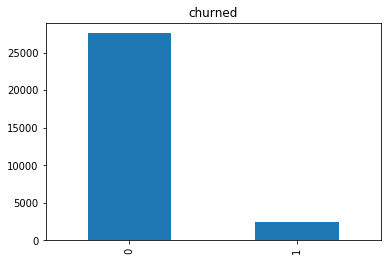

In [24]:
# A box plot to show how many customers has churned or not
churn["churned"].value_counts().plot('bar').set_title('churned')

In [25]:
# Determine Churn Rate
y = churn['churned']
churn_per = (sum(y)/len(y.index))*100
print('Churn Rate of Customers: ', churn_per)
print(churn.shape)

## Churn rate is 8.13.

Churn Rate of Customers:  8.136203105217565
(30014, 153)


In [26]:
# Let's derive some variables. The most important feature, in this situation, 
# can be the difference between the 8th month and the previous months. 
# The difference can be in patterns such as usage difference or recharge value difference. 
# Let's calculate difference variable as the difference between 8th month and the average of 6th and 7th month.

churn['arpu_diff'] = churn.arpu_8 - ((churn.arpu_6 + churn.arpu_7)/2)
churn['onnet_mou_diff'] = churn.onnet_mou_8 - ((churn.onnet_mou_6 + churn.onnet_mou_7)/2)
churn['offnet_mou_diff'] = churn.offnet_mou_8 - ((churn.offnet_mou_6 + churn.offnet_mou_7)/2)
churn['roam_ic_mou_diff'] = churn.roam_ic_mou_8 - ((churn.roam_ic_mou_6 + churn.roam_ic_mou_7)/2)
churn['roam_og_mou_diff'] = churn.roam_og_mou_8 - ((churn.roam_og_mou_6 + churn.roam_og_mou_7)/2)
churn['loc_og_mou_diff'] = churn.loc_og_mou_8 - ((churn.loc_og_mou_6 + churn.loc_og_mou_7)/2)
churn['std_og_mou_diff'] = churn.std_og_mou_8 - ((churn.std_og_mou_6 + churn.std_og_mou_7)/2)
churn['isd_og_mou_diff'] = churn.isd_og_mou_8 - ((churn.isd_og_mou_6 + churn.isd_og_mou_7)/2)
churn['spl_og_mou_diff'] = churn.spl_og_mou_8 - ((churn.spl_og_mou_6 + churn.spl_og_mou_7)/2)
churn['total_og_mou_diff'] = churn.total_og_mou_8 - ((churn.total_og_mou_6 + churn.total_og_mou_7)/2)
churn['loc_ic_mou_diff'] = churn.loc_ic_mou_8 - ((churn.loc_ic_mou_6 + churn.loc_ic_mou_7)/2)
churn['std_ic_mou_diff'] = churn.std_ic_mou_8 - ((churn.std_ic_mou_6 + churn.std_ic_mou_7)/2)
churn['isd_ic_mou_diff'] = churn.isd_ic_mou_8 - ((churn.isd_ic_mou_6 + churn.isd_ic_mou_7)/2)
churn['spl_ic_mou_diff'] = churn.spl_ic_mou_8 - ((churn.spl_ic_mou_6 + churn.spl_ic_mou_7)/2)
churn['total_ic_mou_diff'] = churn.total_ic_mou_8 - ((churn.total_ic_mou_6 + churn.total_ic_mou_7)/2)
churn['total_rech_num_diff'] = churn.total_rech_num_8 - ((churn.total_rech_num_6 + churn.total_rech_num_7)/2)
churn['total_rech_amt_diff'] = churn.total_rech_amt_8 - ((churn.total_rech_amt_6 + churn.total_rech_amt_7)/2)
churn['max_rech_amt_diff'] = churn.max_rech_amt_8 - ((churn.max_rech_amt_6 + churn.max_rech_amt_7)/2)
churn['total_rech_call_and_data_diff'] = churn.total_rech_call_and_data_amt_8 - ((churn.total_rech_call_and_data_amt_6 + churn.total_rech_call_and_data_amt_7)/2)
churn['max_rech_data_diff'] = churn.max_rech_data_8 - ((churn.max_rech_data_6 + churn.max_rech_data_7)/2)
churn['vol_2g_mb_diff'] = churn.vol_2g_mb_8 - ((churn.vol_2g_mb_6 + churn.vol_2g_mb_7)/2)
churn['vol_3g_mb_diff'] = churn.vol_3g_mb_8 - ((churn.vol_3g_mb_6 + churn.vol_3g_mb_7)/2)

In [27]:
# Creating new feature by adding all 2G, 3G Data
# 'vol_data_mb_6', 'vol_data_mb_7', 'vol_data_mb_8'
for i in range(6,8):
    churn['vol_data_mb_'+str(i)] = (churn['vol_2g_mb_'+str(i)]+churn['vol_3g_mb_'+str(i)]).astype(int)

In [28]:
# Correlate all columns with churned column to know if there are any positive and negative correlation.
churn[churn.columns[1:]].corr()['churned'][:].sort_values(ascending=False)


churned                           1.000000
rech_days_left_8                  0.247858
rech_data_days_left_8             0.205237
std_og_mou_6                      0.126757
roam_og_mou_7                     0.107066
rech_data_days_left_7             0.106622
std_og_t2m_mou_6                  0.097245
rech_days_left_7                  0.096795
std_og_t2t_mou_6                  0.092668
roam_og_mou_8                     0.092657
roam_ic_mou_7                     0.082147
roam_ic_mou_8                     0.076328
total_rech_amt_6                  0.075070
total_og_mou_6                    0.075016
onnet_mou_6                       0.070736
total_rech_num_6                  0.063727
rech_data_days_left_6             0.057193
std_og_mou_7                      0.053865
roam_og_mou_6                     0.051436
offnet_mou_6                      0.050799
std_og_t2m_mou_7                  0.042953
std_og_t2t_mou_7                  0.036600
roam_ic_mou_6                     0.034734
std_ic_t2t_

### Insight and Important Churn Indicators

We could predict Customers who could Churn with +ve correlation features. 

We can reach to these customers and give some offers and discounts to retain them.

rech_days_left_8 : Customers who has more days to recharge TalkTime have churned. Giving the offer early in the month will help to retain.

rech_data_days_left_8 : Customers who has more days to recharge DATA have churned. Giving the offer early in the month will help to retain.

std_og_mou_6 : Customers who did more STD outgoing calls have churned. Giving discounts to STD calls will help to retain.

roam_og_mou_7 : Customers who were in roaming and making outgoing calls have Churned. Giving discounts to Roaming calls will help to retain.


### Insight about Customers who haven't churned from Columns having negative corelation

arpu_diff : 'Average revenue per user' Customers who were generating same revenue for 6th, 7th and 8th month have not churned.

total_rech_amt_diff : Customers who have been recharging same amount for 6th, 7th and 8th month have not churned.

total_ic_mou_8 : Customers who got high incoming calls in 8th month, have not churned

## Univariate EDA

In [29]:
# create plotting functions
def data_type(variable):
    if variable.dtype == np.int64 or variable.dtype == np.float64:
        return 'numerical'
    elif variable.dtype == 'category':
        return 'categorical'
    
def univariate(variable, stats=True):
    if data_type(variable) == 'numerical':
        sns.distplot(variable)
        if stats == True:
            print(variable.describe())
    elif data_type(variable) == 'categorical':
        sns.countplot(variable)
        if stats == True:
            print(variable.value_counts())
    else:
        print("Invalid variable passed: either pass a numeric variable or a categorical vairable.")

def plot_byChurnMou(colList,calltype):
    fig, ax = plt.subplots(figsize=(7,4))
    df=churn.groupby(['churned'])[colList].mean().T
    plt.plot(df)
    ax.set_xticklabels(['Jun','Jul','Aug','Sep'])
    ## Add legend
    plt.legend(['Non-Churn', 'Churn'])
    # Add titles
    plt.title("Avg. "+calltype+" MOU  V/S Month", loc='left', fontsize=12, fontweight=0, color='orange')
    plt.xlabel("Month")
    plt.ylabel("Avg. "+calltype+" MOU")

def plot_byChurn(data,col):
    # per month churn vs Non-Churn
    fig, ax = plt.subplots(figsize=(7,4))
    colList=list(data.filter(regex=(col)).columns)
    colList = colList[:3]
    plt.plot(churn.groupby('churned')[colList].mean().T)
    ax.set_xticklabels(['Jun','Jul','Aug','Sep'])
    ## Add legend
    plt.legend(['Non-Churn', 'Churn'])
    # Add titles
    plt.title( str(col) +" V/S Month", loc='left', fontsize=12, fontweight=0, color='orange')
    plt.xlabel("Month")
    plt.ylabel(col)
    plt.show()
    # Numeric stats for per month churn vs Non-Churn
    return churn.groupby('churned')[colList].mean()

count    30014.000000
mean       321.639402
std       2252.709078
min          0.000000
25%          1.000000
50%          3.000000
75%          6.000000
max      16313.000000
Name: rech_days_left_8, dtype: float64


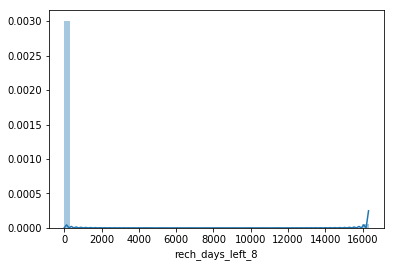

In [30]:
univariate(churn.rech_days_left_8)

count    30014.000000
mean       321.001649
std        495.642521
min          0.000000
25%          0.380000
50%         45.170000
75%        465.427500
max       1834.783000
Name: std_og_mou_6, dtype: float64


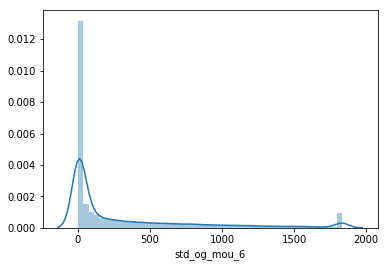

In [31]:
univariate(churn.std_og_mou_6)

count    30014.000000
mean        13.085471
std         42.719521
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max        215.685000
Name: roam_og_mou_7, dtype: float64


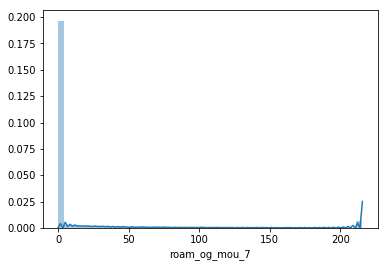

In [32]:
univariate(churn.roam_og_mou_7) 

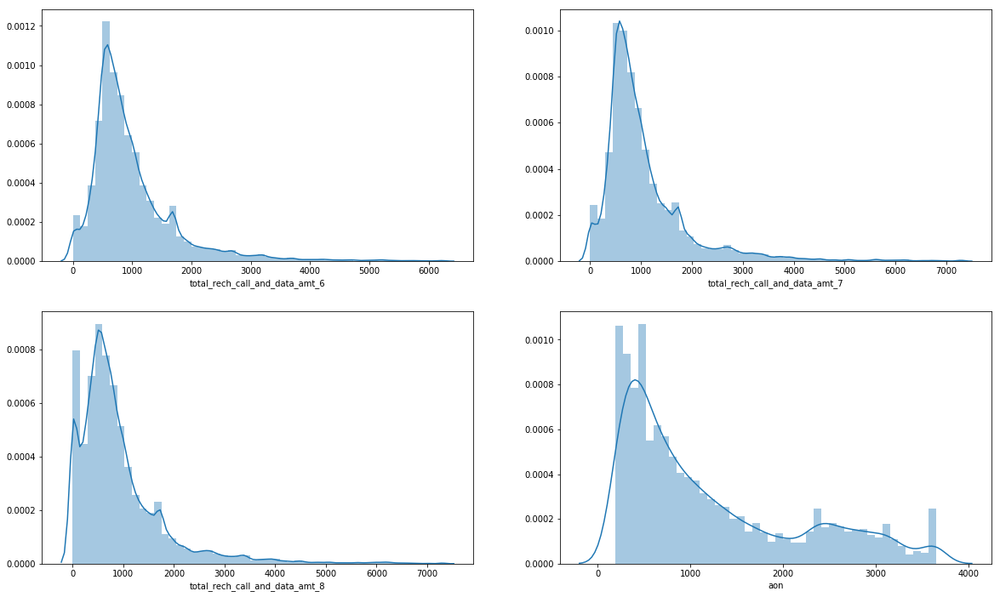

In [33]:
# checking the total_rech_data_* to see the distribution

plt.figure(figsize=(20, 12))
plt.subplot(2,2,1)
sns.distplot(churn.total_rech_call_and_data_amt_6)

plt.subplot(2,2,2)
sns.distplot(churn.total_rech_call_and_data_amt_7)

plt.subplot(2,2,3)
sns.distplot(churn.total_rech_call_and_data_amt_8)

plt.subplot(2,2,4)
sns.distplot(churn.aon)

plt.show()

In [34]:
numerical_features = ['total_rech_call_and_data_amt_6', 'total_rech_call_and_data_amt_7', 'total_rech_call_and_data_amt_8']
churn[numerical_features].describe()

,total_rech_call_and_data_amt_6,total_rech_call_and_data_amt_7,total_rech_call_and_data_amt_8
count,30014.000000,30014.000000,30014.000000
mean,996.359593,1063.766659,925.495385
std,754.372363,874.266834,907.757622
min,0.000000,0.000000,0.000000
25%,546.000000,550.000000,396.000000
50%,787.000000,812.000000,688.000000
75%,1206.000000,1262.750000,1150.000000
max,6228.020000,7288.000000,7301.000000


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x1a26975400>,
      dtype=object)

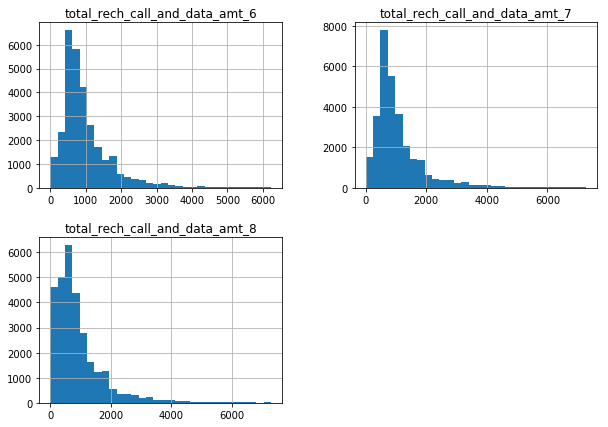

In [35]:
churn[numerical_features].hist(bins=30, figsize=(10, 7))

## Bivariate EDA

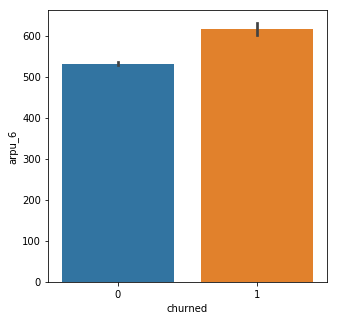

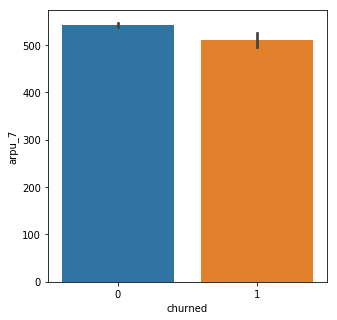

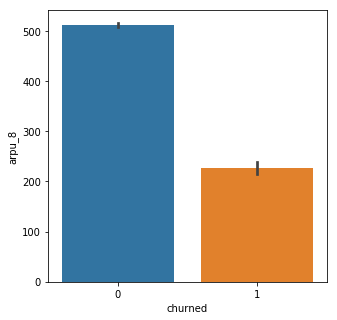

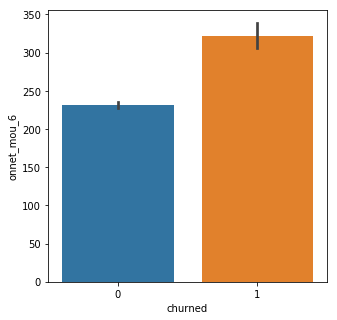

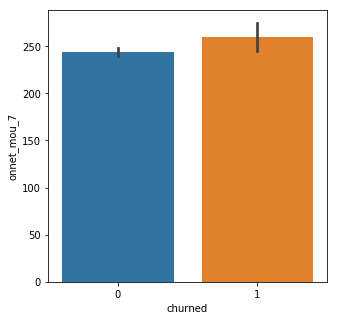

...

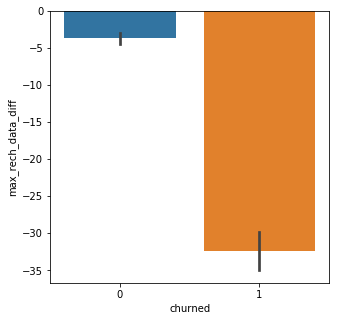

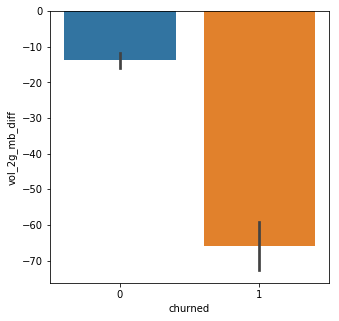

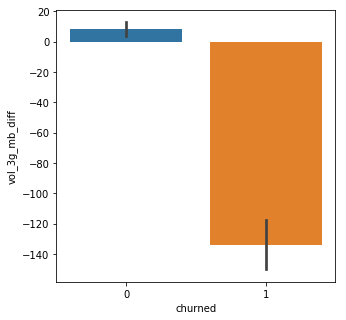

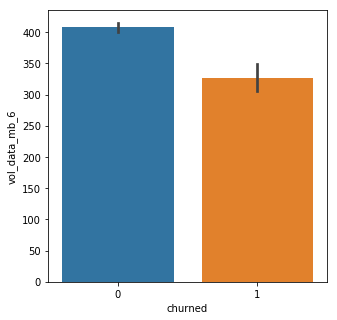

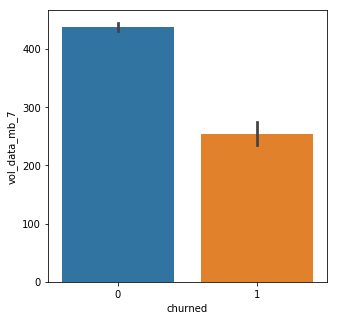

In [36]:
# Review two columns with churn as target
cont_cols = [col for col in churn.columns ]
for col in cont_cols:
    plt.figure(figsize=(5, 5))
    sns.barplot(x='churned', y=col, data=churn)
    plt.show()


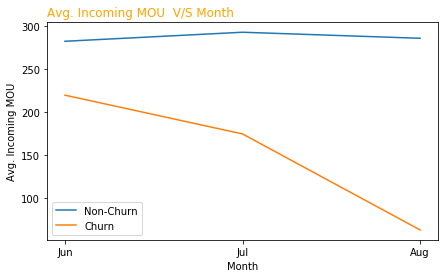

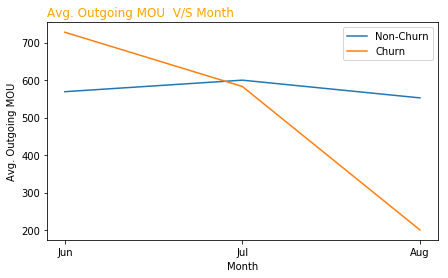

In [37]:
ic_col = ['total_ic_mou_6','total_ic_mou_7','total_ic_mou_8']
og_col = ['total_og_mou_6','total_og_mou_7','total_og_mou_8']
plot_byChurnMou(ic_col,'Incoming')
plot_byChurnMou(og_col,'Outgoing')

From above plot we could determine
- Customers who churned, has a drop in incoming and outgoing calls between Jun, Jul and August.

- Customers who did not churn, remained almost flat


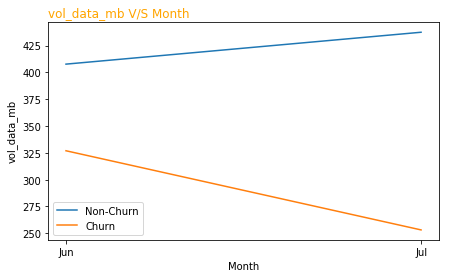

,vol_data_mb_6,vol_data_mb_7
churned,,
0,407.733969,437.462426
1,326.966830,253.167486


In [38]:
plot_byChurn(churn,'vol_data_mb')

From above plot we could determine that
- The volume of data mb used drops significantly for churners from month Jul(6) to Aug(7).
- While it remains almost consistent for the non-churners.

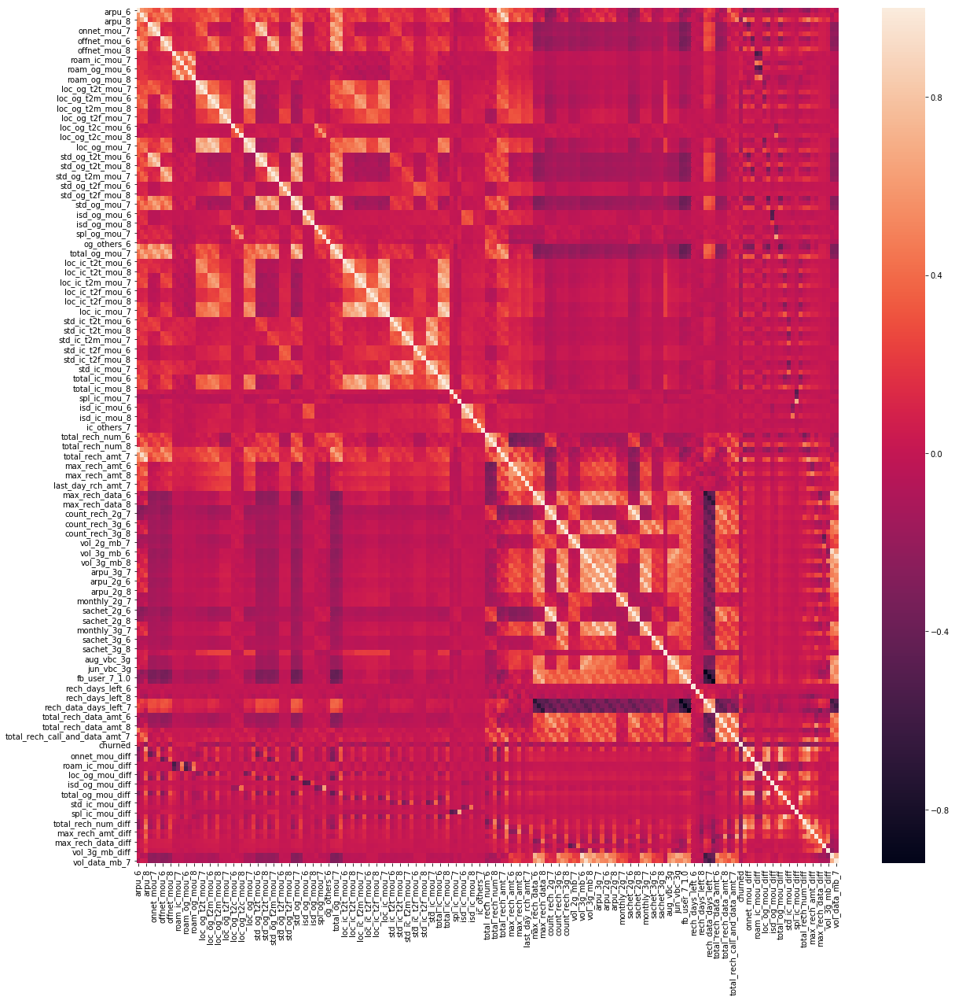

In [39]:
churn2 = churn.copy()
churn2.drop(['churned'], axis=1)


# Let's see the correlation matrix 
plt.figure(figsize = (20,20))        # Size of the figure
sns.heatmap(churn2.corr())


In [40]:
# Create correlation matrix
corr_matrix = churn2.corr().abs()

# Select upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

# Find index of feature columns whose correlation greater than 0.80
high_corr_features = [column for column in upper.columns if any(upper[column] > 0.80)]

print("Highly Correlated Features :{}\n\n{}".format(len(high_corr_features), high_corr_features))


Highly Correlated Features :59

['onnet_mou_8', 'roam_og_mou_6', 'roam_og_mou_7', 'roam_og_mou_8', 'loc_og_t2t_mou_7', 'loc_og_t2t_mou_8', 'loc_og_t2m_mou_7', 'loc_og_t2m_mou_8', 'loc_og_mou_6', 'loc_og_mou_7', 'loc_og_mou_8', 'std_og_t2t_mou_6', 'std_og_t2t_mou_7', 'std_og_t2t_mou_8', 'std_og_t2m_mou_7', 'std_og_t2m_mou_8', 'std_og_mou_8', 'total_og_mou_6', 'total_og_mou_7', 'total_og_mou_8', 'loc_ic_t2t_mou_7', 'loc_ic_t2t_mou_8', 'loc_ic_t2m_mou_7', 'loc_ic_t2m_mou_8', 'loc_ic_mou_6', 'loc_ic_mou_7', 'loc_ic_mou_8', 'std_ic_mou_6', 'std_ic_mou_7', 'std_ic_mou_8', 'total_ic_mou_6', 'total_ic_mou_7', 'total_ic_mou_8', 'total_rech_amt_6', 'total_rech_amt_7', 'total_rech_amt_8', 'arpu_3g_6', 'arpu_3g_7', 'arpu_3g_8', 'arpu_2g_6', 'arpu_2g_7', 'arpu_2g_8', 'sachet_2g_6', 'sachet_2g_7', 'sachet_2g_8', 'monthly_3g_6', 'monthly_3g_7', 'monthly_3g_8', 'rech_data_days_left_6', 'rech_data_days_left_7', 'rech_data_days_left_8', 'total_rech_call_and_data_amt_6', 'total_rech_call_and_data_amt_7',

There are 59 highly correlated features (> 80%) found in the data set.
We are not dropping these columns manually rather using feature reduction methods to do the job. 

### Stage 2 : Modelling through different methods

### Model 1 : Logistic regression
Logistic Regression is a Machine Learning algorithm which is used for the classification problems, it is a predictive analysis algorithm and based on the concept of probability.

Logistic regression is basically a supervised classification algorithm. 
In a classification problem, the target variable (or output), y, can take only discrete values for given set of features(or inputs), X.

Logistic regression becomes a classification technique only when a decision threshold is brought into the picture. The setting of the threshold value is a very important aspect of Logistic regression and is dependent on the classification problem itself.

The decision for the value of the threshold value is majorly affected by the values of precision and recall. Ideally, we want both precision and recall to be 1, but this seldom is the case. 

In our case Customer Churn is the Target Variable and all other columns are features/input.

In [41]:
# Putting feature variable to X
X = churn.drop(["churned"], axis=1)
# Putting response variable to y
y = churn["churned"]

In [42]:
# Splitting the data into train and test
train_x, test_x, train_y, test_y = train_test_split(X, y, train_size=0.7, test_size=0.3, random_state=100)

Intercept: [-0.06111963]
Regression: [[ 4.94845528e-04  4.92314473e-04  4.10005328e-04  9.86700012e-05
   4.64640752e-04 -4.56018968e-04  3.26035212e-04  1.03360934e-03
   1.72198712e-04 -3.02845787e-04  8.38196701e-04 -8.67458574e-04
   9.14201914e-04  3.80897448e-04  1.44267262e-03 -5.97867771e-04
   2.51205245e-03 -7.17363158e-03 -1.10063974e-03  1.55286652e-03
  -7.54196896e-03 -4.46640890e-03 -9.97016034e-03  2.53288944e-03
  -1.17324505e-02 -8.32415356e-03  1.81356346e-02  2.12458946e-03
  -1.27784865e-03  3.95682644e-03  3.92648149e-04 -1.08325468e-03
  -6.21104638e-04  4.48272214e-05 -1.15954292e-03 -1.98517081e-03
  -3.47777333e-03  7.57646161e-03 -3.48778308e-02  5.92862174e-04
   3.03595585e-04  1.93189657e-03  2.03578281e-03  6.27554142e-02
   2.18785282e-02 -1.85469731e-03 -2.48699809e-03 -3.39585397e-03
  -2.64772662e-02 -8.23902110e-04  1.17896128e-04 -1.43801360e-03
   3.97368878e-03 -1.63611887e-03 -7.27305362e-03  4.20504322e-03
  -6.32013842e-04 -7.95635678e-03  3.85

/anaconda3/lib/python3.7/site-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


Text(0.5, 15.0, 'Predicted label')

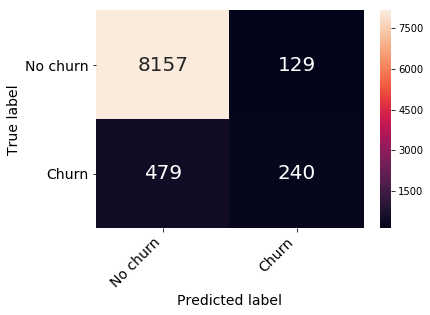

In [43]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, classification_report


logisticRegr = LogisticRegression()
logisticRegr.fit(X=train_x, y=train_y)

test_y_pred = logisticRegr.predict(test_x)
confusion_matrix = confusion_matrix(test_y, test_y_pred)
print('Intercept: ' + str(logisticRegr.intercept_))
print('Regression: ' + str(logisticRegr.coef_))
print('Accuracy of logistic regression classifier on test set: {:.2f}'.format(logisticRegr.score(test_x, test_y)))
print(classification_report(test_y, test_y_pred))

confusion_matrix_df = pd.DataFrame(confusion_matrix, ('No churn', 'Churn'), ('No churn', 'Churn'))
heatmap = sns.heatmap(confusion_matrix_df, annot=True, annot_kws={"size": 20}, fmt="d")
heatmap.yaxis.set_ticklabels(heatmap.yaxis.get_ticklabels(), rotation=0, ha='right', fontsize = 14)
heatmap.xaxis.set_ticklabels(heatmap.xaxis.get_ticklabels(), rotation=45, ha='right', fontsize = 14)
plt.ylabel('True label', fontsize = 14)
plt.xlabel('Predicted label', fontsize = 14)


Accuracy of logistic regression classifier on test set: 0.93

But the Precision and Recall for positive case seems to be low. Which  suggests our data set may be imbalanced.


In [44]:
#It is also important to look at the distribution of how many customers churn. 
# If 95% of customers don’t churn, we can achieve 95% accuracy by building a model 
# that simply predicts that all customers won’t churn. 
# But this isn’t a very useful model, because it will never tell us when a customer will churn, 
# which is what we are really interested in.
churn['churned'].value_counts()

0    27572
1     2442
Name: churned, dtype: int64

The class for churn is only around 8% of the total population of samples. 

There is a real risk that a model trained on this data may only make too many predictions in favour of the majority class. There are a number of techniques for handling imbalanced classes:

## Handle Class Imbalance by up-sampling minority

In [45]:
# Up-sampling the minority class
# To balance the data set, we can randomly duplicate observations from the minority class. 
# This is also known as re sampling with replacement:
from sklearn.utils import resample

data_majority = churn[churn['churned']==0]
data_minority = churn[churn['churned']==1]

data_minority_upsampled = resample(data_minority,
replace=True,
n_samples=27560, #same number of samples as majority class
random_state=1) #set the seed for random resampling

# Combine resampled results
data_upsampled = pd.concat([data_majority, data_minority_upsampled])

data_upsampled['churned'].value_counts()

0    27572
1    27560
Name: churned, dtype: int64

In [46]:
# Now that we have a 1:1 ratio for our classes, let’s train another logistic regression model:
train, test = train_test_split(data_upsampled, test_size = 0.3)

train_y_upsampled = train['churned']
test_y_upsampled = test['churned']

train_x_upsampled = train
train_x_upsampled.pop('churned')
test_x_upsampled = test
test_x_upsampled.pop('churned')

logisticRegr_balanced = LogisticRegression()
logisticRegr_balanced.fit(X=train_x_upsampled, y=train_y_upsampled)

test_y_pred_balanced = logisticRegr_balanced.predict(test_x_upsampled)
print('Accuracy of logistic regression classifier on test set: {:.2f}'.format(logisticRegr_balanced.score(test_x_upsampled, test_y_upsampled)))
print(classification_report(test_y_upsampled, test_y_pred_balanced))


Accuracy of logistic regression classifier on test set: 0.83
              precision    recall  f1-score   support

           0       0.83      0.83      0.83      8284
           1       0.83      0.83      0.83      8256

   micro avg       0.83      0.83      0.83     16540
   macro avg       0.83      0.83      0.83     16540
weighted avg       0.83      0.83      0.83     16540



The overall accuracy of the model has decreased from 93% to 83%

But the precision and recall scores for predicting a churn have improved to 83%. 

There are a number of other ways to deal with imbalanced classes, like below

In [47]:
# Using a different performance metric
# Area Under ROC Curve (AUROC) represents the likelihood of a model distinguishing observations between two classes. 
# In very simple terms, AUROC gives a single measure of how a model’s true positive rate and false positive rate change with different threshold values. 
# The closer a model’s AUROC score is to 1, the better it is. 
# To calculate AUROC, we need the predicted class probabilities:
from sklearn.metrics import roc_auc_score

# Get class probabilities for both models
test_y_prob = logisticRegr.predict_proba(test_x)
test_y_prob_balanced = logisticRegr_balanced.predict_proba(test_x_upsampled)

# We only need the probabilities for the positive class
test_y_prob = [p[1] for p in test_y_prob]
test_y_prob_balanced = [p[1] for p in test_y_prob_balanced]

print('Unbalanced model AUROC: ' + str(roc_auc_score(test_y, test_y_prob)))
print('Balanced model AUROC: ' + str(roc_auc_score(test_y_upsampled, test_y_prob_balanced)))


Unbalanced model AUROC: 0.8934662652992782
Balanced model AUROC: 0.9050166374471756


The AUROC score for Balanced model is closer to 1. Hence we should prefer the Balanced model for Prediction.

### Model 2 : Tree-based algorithms
 - Decision Trees
 - Random Forest

Using tree-based algorithms such as decision trees or random forests can result in good models for 
unbalanced datasets. If the minority class exists in one area of the feature space, a tree will be able 
to separate the class into a single node.
For example, if 99% of customers who stream movies tend to churn, then a tree-based algorithm will likely pick this up. 
We will look at the results for two of these algorithms in the next section.



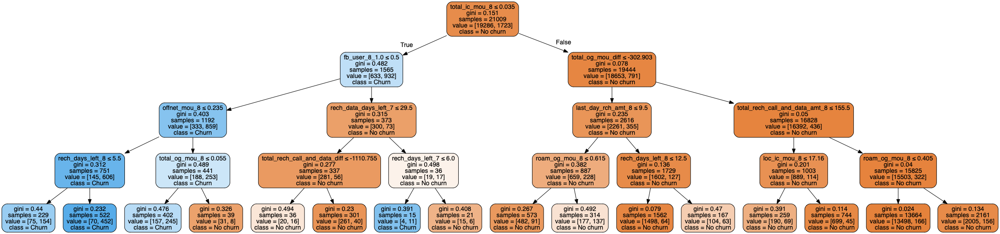

In [48]:
# Decision Trees
# A decision tree is a supervised learning method that makes a prediction by learning simple decision rules from the explanatory variables. 
# Decision trees have the following advantages:

#Trees can be visualised, which makes them easy to interpret
#They can handle numerical and categorical data
#We can easily validate the model using statistical tests
#The downsides to decision trees:

#Decision trees are very prone to overfitting the training data, and often do not generalise well
#Small variations in the training data can cause a completely different tree to be generated
#Decision tree learning algorithms are based on heuristic algorithms like the greedy algorithm, which make locally optimal decisions at each node. 
#These algorithms cannot guarantee a globally optimal decision tree
#Despite their downsides, decision trees can be a good starting point for developing predictive models that generalise better, like random forests.

from sklearn import tree
from IPython.display import Image  
import graphviz 
import pydotplus
from sklearn.externals.six import StringIO  
from sklearn.tree import export_graphviz


# Create each decision tree (pruned and unpruned)
decisionTree_unpruned = tree.DecisionTreeClassifier()
decisionTree = tree.DecisionTreeClassifier(max_depth = 4)

# Fit each tree to our training data
decisionTree_unpruned = decisionTree_unpruned.fit(X=train_x, y=train_y)
decisionTree = decisionTree.fit(X=train_x, y=train_y)

dot_data = StringIO()
export_graphviz(decisionTree, out_file=dot_data,  
                feature_names = list(train_x.columns.values),  
                class_names = ['No churn', 'Churn'],
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [49]:
test_y_pred_dt = decisionTree.predict(test_x)

print(classification_report(test_y, test_y_pred_dt))
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
print('Accuracy of decision tree classifier on test set: {:.2f}'.format(decisionTree.score(test_x, test_y)))
print(confusion_matrix(test_y,test_y_pred_dt))
print(accuracy_score(test_y,test_y_pred_dt))

              precision    recall  f1-score   support

           0       0.96      0.98      0.97      8286
           1       0.72      0.50      0.59       719

   micro avg       0.94      0.94      0.94      9005
   macro avg       0.84      0.74      0.78      9005
weighted avg       0.94      0.94      0.94      9005

Accuracy of decision tree classifier on test set: 0.94
[[8149  137]
 [ 359  360]]
0.9449194891726819


### Tune HyperParameters

We have set the maximum depth of the tree to 4 in the above example. 

The other variable controlling the size of the tree is ‘min_samples_leaf’, 
which specifies the minimum number of samples required to split an internal node. 

The default depth and minimum samples per leaf are set to unlimited, which leads to fully grown and unpruned trees, like this:

In [50]:
from sklearn import tree
from IPython.display import Image  
import graphviz 
import pydotplus
from sklearn.externals.six import StringIO  
from sklearn.tree import export_graphviz


# Create each decision tree (pruned and unpruned)
decisionTree_unpruned = tree.DecisionTreeClassifier()
decisionTree = tree.DecisionTreeClassifier()


# Fit each tree to our training data
decisionTree_unpruned = decisionTree_unpruned.fit(X=train_x, y=train_y)
decisionTree = decisionTree.fit(X=train_x, y=train_y)

dot_data = StringIO()
export_graphviz(decisionTree, out_file=dot_data,  
                feature_names = list(train_x.columns.values),  
                class_names = ['No churn', 'Churn'],
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

An unpruned tree is effectively trying to sort every training example 

‘perfectly’ into its own leaf. We will get very good ‘accuracy’ 
when testing against the training set, but it is likely that the 
model is over fitted.

Let’s see what kind of accuracy each of the trees get on test and training sets:

In [51]:
test_y_pred_dt = decisionTree.predict(test_x)
print('Accuracy of decision tree classifier on test set: {:.2f}'.format(decisionTree.score(test_x, test_y)))
print(classification_report(test_y, test_y_pred_dt))
print(confusion_matrix(test_y,test_y_pred_dt))
print(accuracy_score(test_y,test_y_pred_dt))

Accuracy of decision tree classifier on test set: 0.92
              precision    recall  f1-score   support

           0       0.96      0.95      0.95      8286
           1       0.48      0.49      0.49       719

   micro avg       0.92      0.92      0.92      9005
   macro avg       0.72      0.72      0.72      9005
weighted avg       0.92      0.92      0.92      9005

[[7904  382]
 [ 364  355]]
0.9171571349250417


#### Model 3 : Random forests

Random forests are an ensemble learning method, where the results from multiple decision trees are combined to make a final prediction. For example, a random forest may be made up of 10 decision trees,  7 of which make a prediction for ‘churn’ and 3 of which make a prediction for ‘no churn’. 

The final prediction for the forest will be ‘churn’.
Tree ensembles have become very popular due to their impressive performance on many real world problems.

In [52]:
from sklearn.ensemble import RandomForestClassifier
randomForest = RandomForestClassifier()
randomForest.fit(train_x, train_y)
test_y_pred_dt = randomForest.predict(test_x)

print('Accuracy of random forest classifier on test set: {:.2f}'.format(randomForest.score(test_x, test_y)))

print(classification_report(test_y, test_y_pred_dt))
print(confusion_matrix(test_y,test_y_pred_dt))
print(accuracy_score(test_y,test_y_pred_dt))

Accuracy of random forest classifier on test set: 0.94
              precision    recall  f1-score   support

           0       0.95      0.99      0.97      8286
           1       0.73      0.43      0.54       719

   micro avg       0.94      0.94      0.94      9005
   macro avg       0.84      0.71      0.76      9005
weighted avg       0.93      0.94      0.94      9005

[[8174  112]
 [ 409  310]]
0.9421432537479179


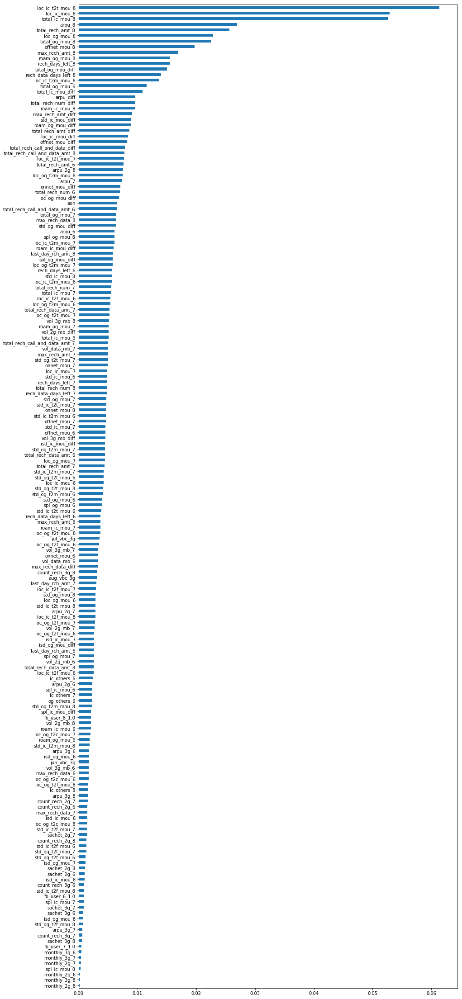

In [53]:
plt.figure(figsize=(15,40))
feat_importances = pd.Series(randomForest.feature_importances_, index=X.columns)
feat_importances.nlargest(len(X.columns)).sort_values().plot(kind='barh', align='center')

The above graph above suggest that the top features ranked in order of importance as produced by our RandomForest implementation are the features that belong to month 8 i.e., the action month. 

Hence, it is clear that what happens in the action phase has a direct impact on the customer churn of high value customers. Specifically, these features are as follows:

total_ic_mou_8 -> Total incoming minutes of usage in month 8

loc_ic_mou_8 -> local incoming minutes of usage in month 8

total_rech_call_and_data_amt_8 -> Total (talk time and data) recharge amount in month 8

### Model 4 : PCA - Dimensionality reduction

The main idea of principal component analysis (PCA) is to reduce the dimensionality of a data set consisting of many variables correlated with each other, either heavily or lightly, while retaining the variation present in the dataset, up to the maximum extent. The same is done by transforming the variables to a new set of variables, which are known as the principal components (or simply, the PCs) and are orthogonal, ordered such that the retention of variation present in the original variables decreases as we move down in the order. So, in this way, the 1st principal component retains maximum variation that was present in the original components. The principal components are the eigenvectors of a covariance matrix, and hence they are orthogonal.

In [54]:
from sklearn.decomposition import PCA
pca = PCA(random_state=100)
pca.fit(train_x)
df_train_pca = pca.fit_transform(train_x)
print(df_train_pca.shape)
df_test_pca = pca.transform(test_x)
print(df_test_pca.shape)

(21009, 176)
(9005, 176)


In [55]:
# Run the model using the selected variables
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
logsk = LogisticRegression(C=1e9)
logsk.fit(df_train_pca, train_y)

# Predicted probabilities
y_pred = logsk.predict(df_test_pca)
# Converting y_pred to a dataframe which is an array
y_pred_df = pd.DataFrame(y_pred)

from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

# Printing confusion matrix
print(confusion_matrix(test_y,y_pred))

[[7881  405]
 [ 333  386]]


/anaconda3/lib/python3.7/site-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


In [56]:
print("LogisticRegression accuracy with PCA: ",accuracy_score(test_y,y_pred))

LogisticRegression accuracy with PCA:  0.9180455302609661


In [57]:
colnames = list(X.columns)
pcs_df = pd.DataFrame({'PC1':pca.components_[0],'PC2':pca.components_[1], 'PC3':pca.components_[2],'Feature':colnames})
pcs_df.head(10)

,PC1,PC2,PC3,Feature
0,0.006113,-0.000736,0.009446,arpu_6
1,0.005496,-0.008766,-0.005337,arpu_7
2,0.002843,-0.015682,0.002699,arpu_8
3,0.008980,-0.004183,0.002909,onnet_mou_6
4,0.009286,-0.006494,0.000832,onnet_mou_7
5,0.007191,-0.007281,0.001259,onnet_mou_8
6,0.010409,-0.005389,0.004350,offnet_mou_6
7,0.010408,-0.008437,0.000222,offnet_mou_7
8,0.007515,-0.009539,0.000833,offnet_mou_8
9,0.000203,-0.000146,-0.000028,roam_ic_mou_6


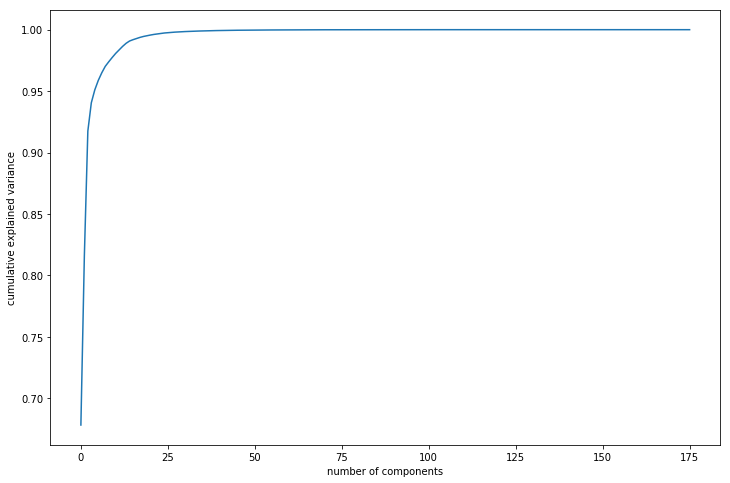

In [58]:
#Making the screeplot - plotting the cumulative variance against the number of components
%matplotlib inline
fig = plt.figure(figsize = (12,8))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.show()

In [59]:
np.cumsum(np.round(pca.explained_variance_ratio_, decimals=4)*100)

array([67.81, 81.59, 91.74, 94.04, 95.09, 95.86, 96.48, 97.01, 97.38,
       97.73, 98.06, 98.35, 98.63, 98.88, 99.07, 99.18, 99.28, 99.37,
       99.45, 99.51, 99.56, 99.61, 99.65, 99.69, 99.73, 99.76, 99.78,
       99.8 , 99.82, 99.83, 99.84, 99.85, 99.86, 99.87, 99.88, 99.89,
       99.9 , 99.91, 99.92, 99.93, 99.94, 99.94, 99.94, 99.94, 99.94,
       99.94, 99.94, 99.94, 99.94, 99.94, 99.94, 99.94, 99.94, 99.94,
       99.94, 99.94, 99.94, 99.94, 99.94, 99.94, 99.94, 99.94, 99.94,
       99.94, 99.94, 99.94, 99.94, 99.94, 99.94, 99.94, 99.94, 99.94,
       99.94, 99.94, 99.94, 99.94, 99.94, 99.94, 99.94, 99.94, 99.94,
       99.94, 99.94, 99.94, 99.94, 99.94, 99.94, 99.94, 99.94, 99.94,
       99.94, 99.94, 99.94, 99.94, 99.94, 99.94, 99.94, 99.94, 99.94,
       99.94, 99.94, 99.94, 99.94, 99.94, 99.94, 99.94, 99.94, 99.94,
       99.94, 99.94, 99.94, 99.94, 99.94, 99.94, 99.94, 99.94, 99.94,
       99.94, 99.94, 99.94, 99.94, 99.94, 99.94, 99.94, 99.94, 99.94,
       99.94, 99.94,

# Apply logistic regression with 3 columns (90% explained variance)

In [60]:
pca3 = PCA(n_components=3)

In [61]:
df_train_pca3 = pca3.fit_transform(train_x)
print(df_train_pca3.shape)
df_test_pca3 = pca3.transform(test_x)
print(df_test_pca3.shape)

(21009, 3)
(9005, 3)


In [62]:
# Let's run the model using the selected variables
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
logsk1 = LogisticRegression(C=1e9)
logsk1.fit(df_train_pca3, train_y)

# Predicted probabilities
y_pred3 = logsk1.predict(df_test_pca3)
# Converting y_pred to a dataframe which is an array
y_pred_df = pd.DataFrame(y_pred3)

In [63]:
# Printing confusion matrix
print(confusion_matrix(test_y,y_pred3))
print("LogisticRegression accuracy with PCA: ",accuracy_score(test_y,y_pred3))

[[8286    0]
 [ 719    0]]
LogisticRegression accuracy with PCA:  0.9201554691837868


91% accuracy with default PCA
90% variance can be explained with first 3 columns and still maintain 92% accuracy
Key Features are arpu_6, arpu_7, arpu_8

### Identifying important churn indicators ,  insights and Business recommendation

We could predict Customers who could Churn with +ve correlation features. 
We can reach to these customers and give some offers and discounts to retain them.
 - rech_days_left_8 : Customers who has more days to recharge TalkTime have churned. Giving the offer early in the month will help to retain.
 - rech_data_days_left_8 : Customers who has more days to recharge DATA have churned. Giving the offer early in the month will help to retain.
 - std_og_mou_6 : Customers who did more STD outgoing calls have churned. Giving discounts to STD calls will help to retain.
 - roam_og_mou_7 : Customers who were in roaming and making outgoing calls have Churned. Giving discounts to Roaming calls will help to retain.
 - arpu_6, arpu_7, arpu_8 : Average Revenue Per User : Customers who haven't generated revenue are most would Churn.
 


Insight about Customers who haven't churned from Columns having negative corelation
 - arpu_diff : 'Average revenue per user' Customers who were generating same revenue for 6th, 7th and 8th month have not churned.
 - total_rech_amt_diff : Customers who have been recharging same amount for 6th, 7th and 8th month have not churned.
 - total_ic_mou_8 : Customers who got high incoming calls in 8th month, have not churned

### Selection of Model 

Accuracy of logistic regression  (unbalanced) : 93%

Accuracy of logistic regression  (balanced) : 83%

Accuracy of decision Tree : 91%

Accuracy of random forest : 94%

Accuracy of PCA : 91% 

Accuracy of PCA (with first three columns) : 92% 

Clearly Random Forest Model is much better among all other Classification model.